## Explore Data
Using visualisations from packages Sweetwiz, Pandas profiling, D-tale
## Data Clensing of Outliers
We will use Inter-Quartile Range (IQR) proximity rule as our data is partially skewed

# Initialize

In [17]:
#Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import sweetviz

import dtale
#dtale.USE_COLAB = True

In [18]:
# # Read data
df = pd.read_csv('./training.zip', compression='zip')

df_copy = df.copy()


print(df.shape)
print(df.columns.values)


(458, 101)
['CO2168.mean' 'CO2168.std' 'CO2336.mean' 'CO2336.std' 'CO242.mean'
 'CO242.std' 'CO2504.mean' 'CO2504.std' 'Glob.mean' 'Glob.std'
 'H2O168.mean' 'H2O168.std' 'H2O336.mean' 'H2O336.std' 'H2O42.mean'
 'H2O42.std' 'H2O504.mean' 'H2O504.std' 'H2O672.mean' 'H2O672.std'
 'H2O84.mean' 'H2O84.std' 'NET.mean' 'NET.std' 'NO168.mean' 'NO168.std'
 'NO336.mean' 'NO336.std' 'NO42.mean' 'NO42.std' 'NO504.mean' 'NO504.std'
 'NO672.mean' 'NO672.std' 'NO84.mean' 'NO84.std' 'NOx168.mean'
 'NOx168.std' 'NOx336.mean' 'NOx336.std' 'NOx42.mean' 'NOx42.std'
 'NOx504.mean' 'NOx504.std' 'NOx672.mean' 'NOx672.std' 'NOx84.mean'
 'NOx84.std' 'O3168.mean' 'O3168.std' 'O342.mean' 'O342.std' 'O3504.mean'
 'O3504.std' 'O3672.mean' 'O3672.std' 'O384.mean' 'O384.std' 'Pamb0.mean'
 'Pamb0.std' 'PAR.mean' 'PAR.std' 'PTG.mean' 'PTG.std' 'RGlob.mean'
 'RGlob.std' 'RHIRGA168.mean' 'RHIRGA168.std' 'RHIRGA336.mean'
 'RHIRGA336.std' 'RHIRGA42.mean' 'RHIRGA42.std' 'RHIRGA504.mean'
 'RHIRGA504.std' 'RHIRGA672.mean' 'R

## Manual feature selection (Remove features that are known to be dependent)

Here we will only get features that are the mean values of measurement days.

We also want to remove features that measure the same value in different heights, because the higher values are dependent on the measurements on the lower height. Additionally the two UV measurements are know to correlate whith eachother.

In [19]:
# Get all columns that contains the mean value for the measurement day
mean_data = df[[col for col in df.columns if '.mean' in col or col == 'class2']]

# Sensor measuremt heights
measurements_heights = ['740', '672', '504', '336', '168', '84', '42', '23', '0']
# List to keep track which measurement values have been allready added. We want to add measurements from the heighest possible point.
added = []

for height in measurements_heights:
    suffix = height + '.mean'
    suffix_length = len(suffix)
    columns_of_height = [col for col in list(df[[col for col in df.columns if col[-suffix_length:] == suffix]].columns.values)] # Column name of the measurement in current height
    columns_to_drop = []
    if len(columns_of_height) > 0:
        values_names = [value[0:-suffix_length] for value in columns_of_height] # Column names without the height indicator and .mean in the end
        for i, name in enumerate(values_names):
            if name not in added:
                added.append(name)
            else:
                columns_to_drop.append(columns_of_height[i])
    if len(columns_to_drop) > 0:
        mean_data = mean_data.drop(columns_to_drop, axis=1)

singe_measure_df = mean_data.drop('UV_B.mean', axis=1) # Save the new dataframe
singe_measure_df_copy = singe_measure_df.copy()

print(singe_measure_df.shape)
print(singe_measure_df.columns.values)

(458, 19)
['CO2504.mean' 'Glob.mean' 'H2O672.mean' 'NET.mean' 'NO672.mean'
 'NOx672.mean' 'O3672.mean' 'Pamb0.mean' 'PAR.mean' 'PTG.mean'
 'RGlob.mean' 'RHIRGA672.mean' 'RPAR.mean' 'SO2168.mean' 'SWS.mean'
 'T672.mean' 'UV_A.mean' 'CS.mean' 'class2']


## Explore Data

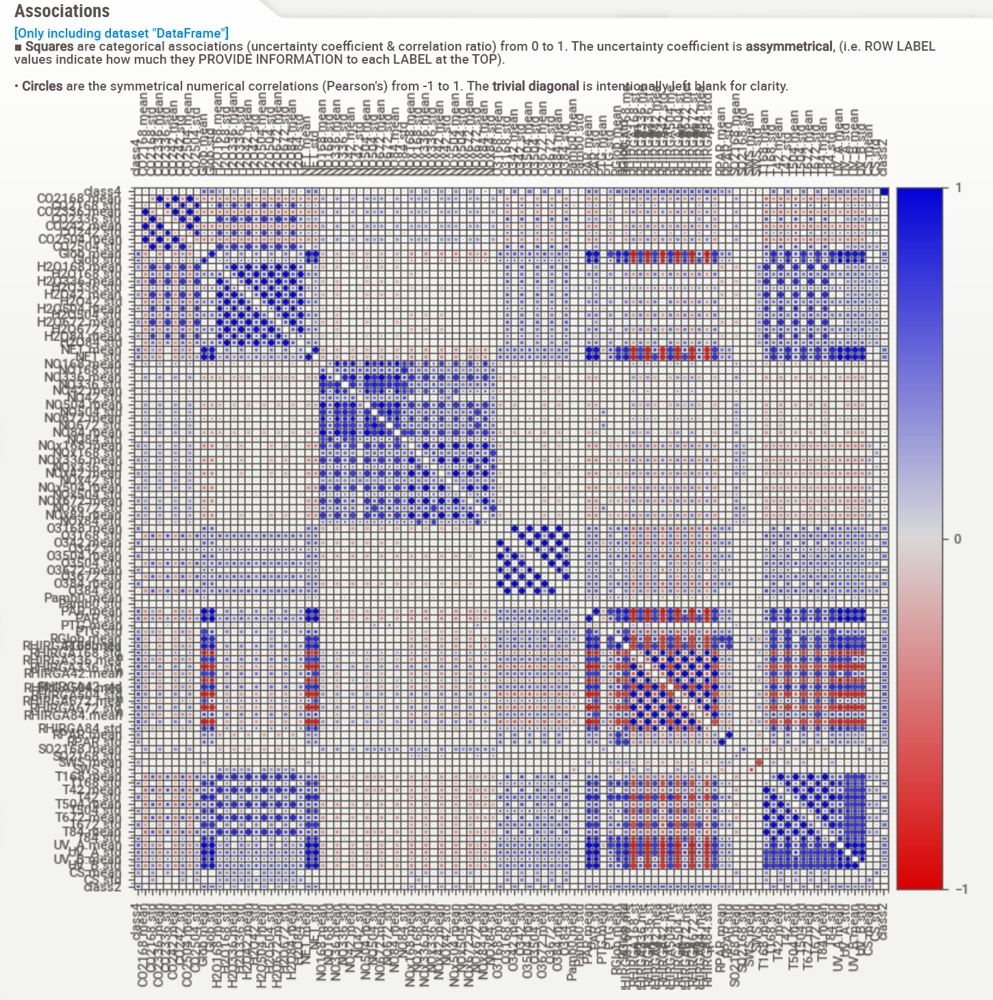

In [3]:
from IPython import display
display.Image("./associations.png")

# D-tale

On full data

In [12]:
## dtale (d-tail)
dtale.show(open_browser=True)
d = dtale.show(df)

On data with manual feature selection

In [4]:
dtale.show(open_browser=True)
single_d = dtale.show(singe_measure_df)

# Sweetwiz

On full data

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:14 -> (00:00 left)


Report Report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



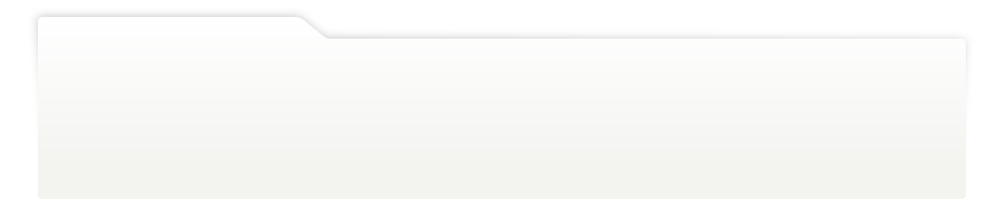
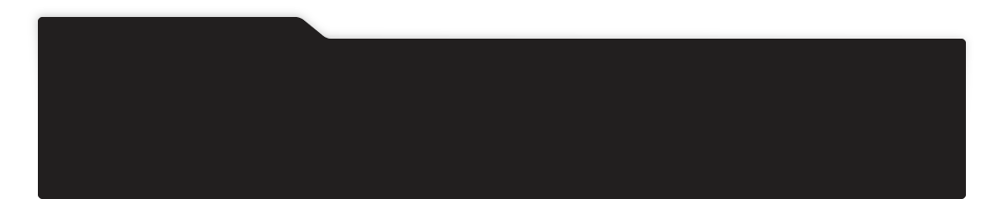
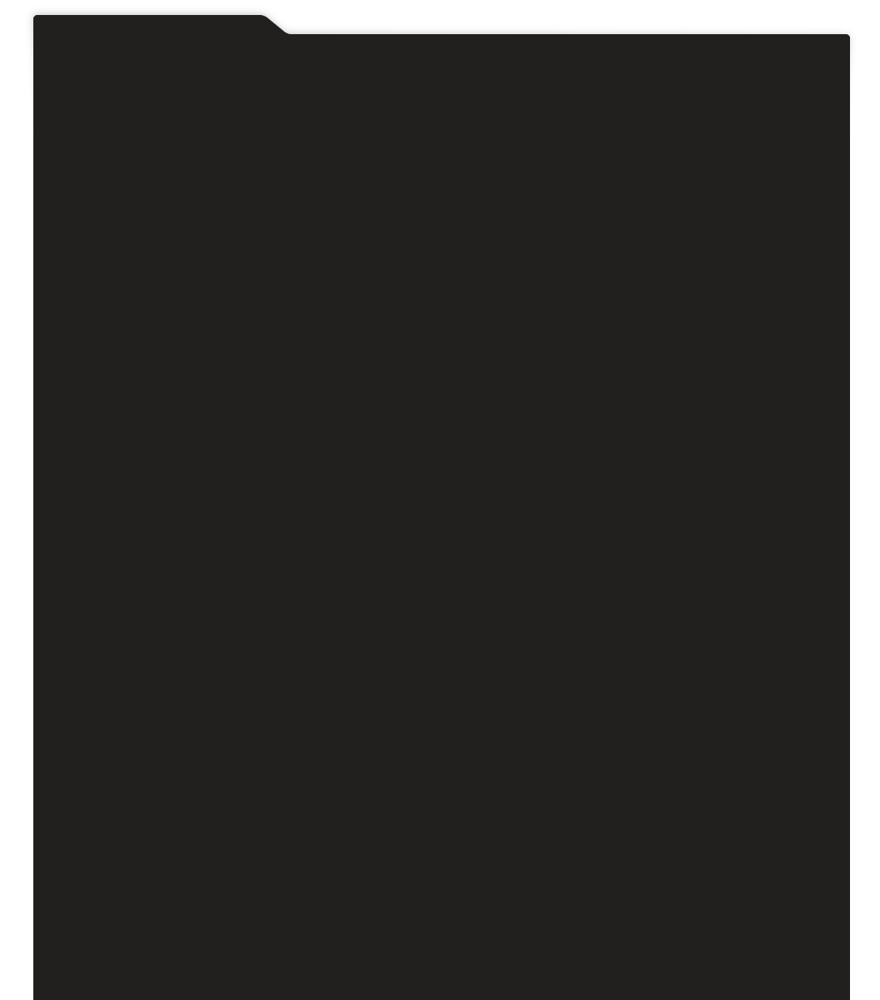
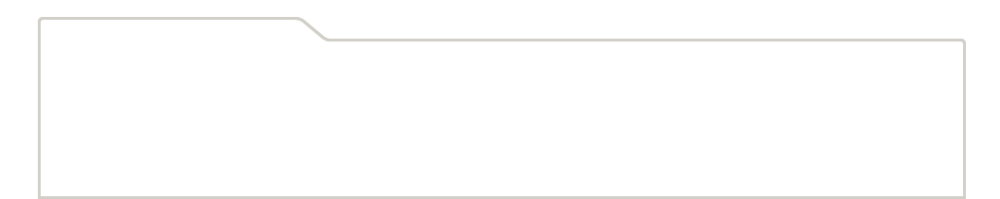
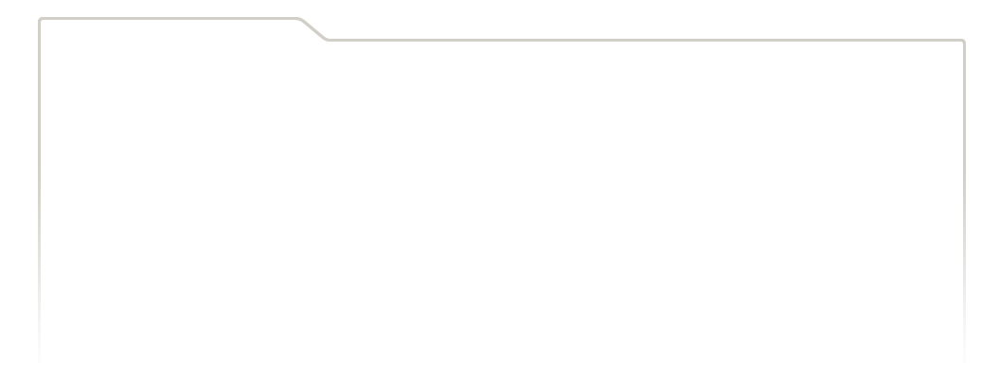
...
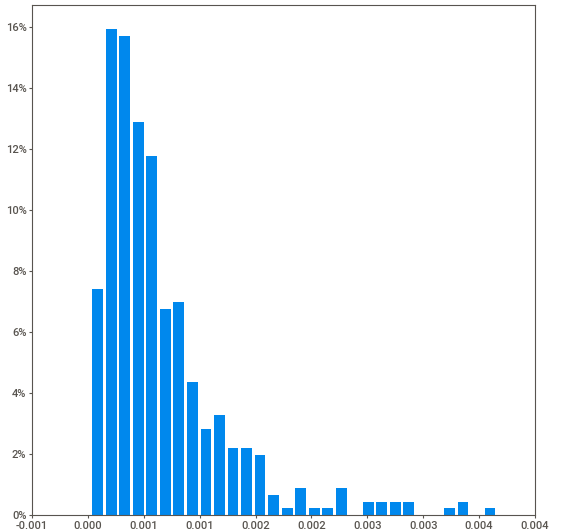
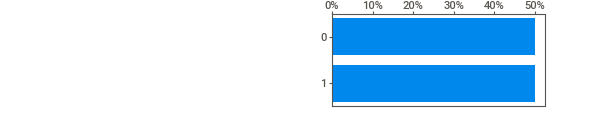
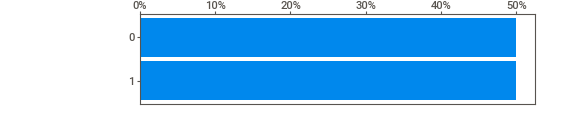
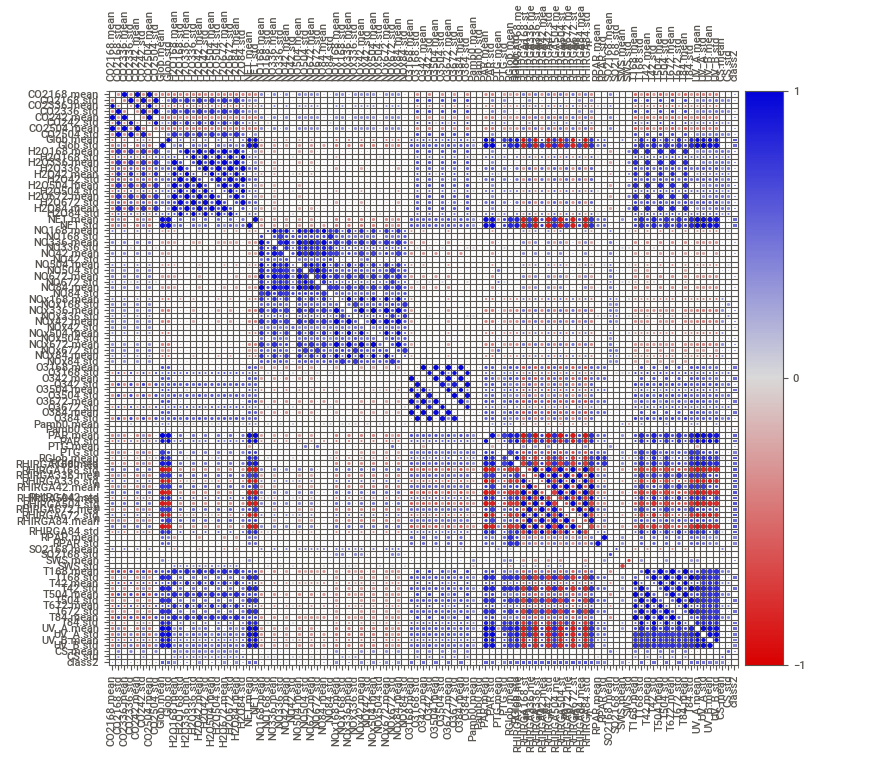
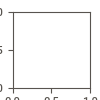

In [13]:
##sweetwiz
# Generate report
my_report = sweetviz.analyze(df)
my_report.show_html('Report.html')
#my_report.show_notebook('Report.html')

On data with manual feature selection

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:01 -> (00:00 left)


Report Small features report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



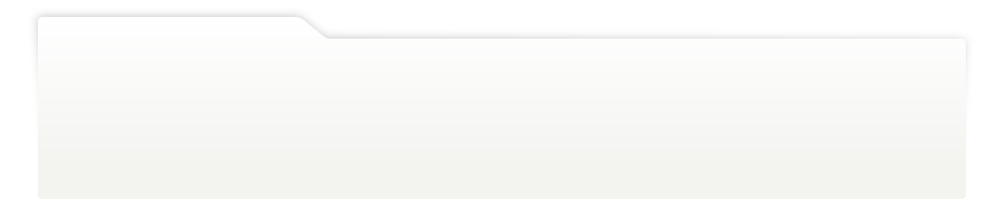
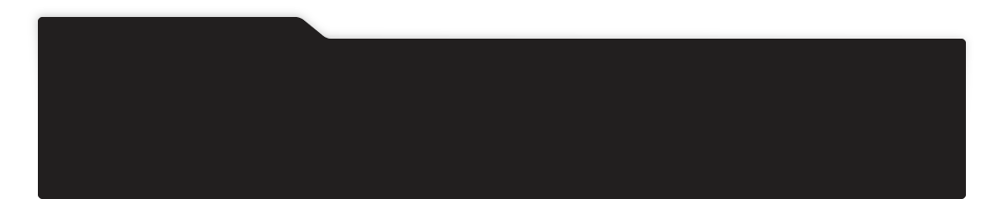
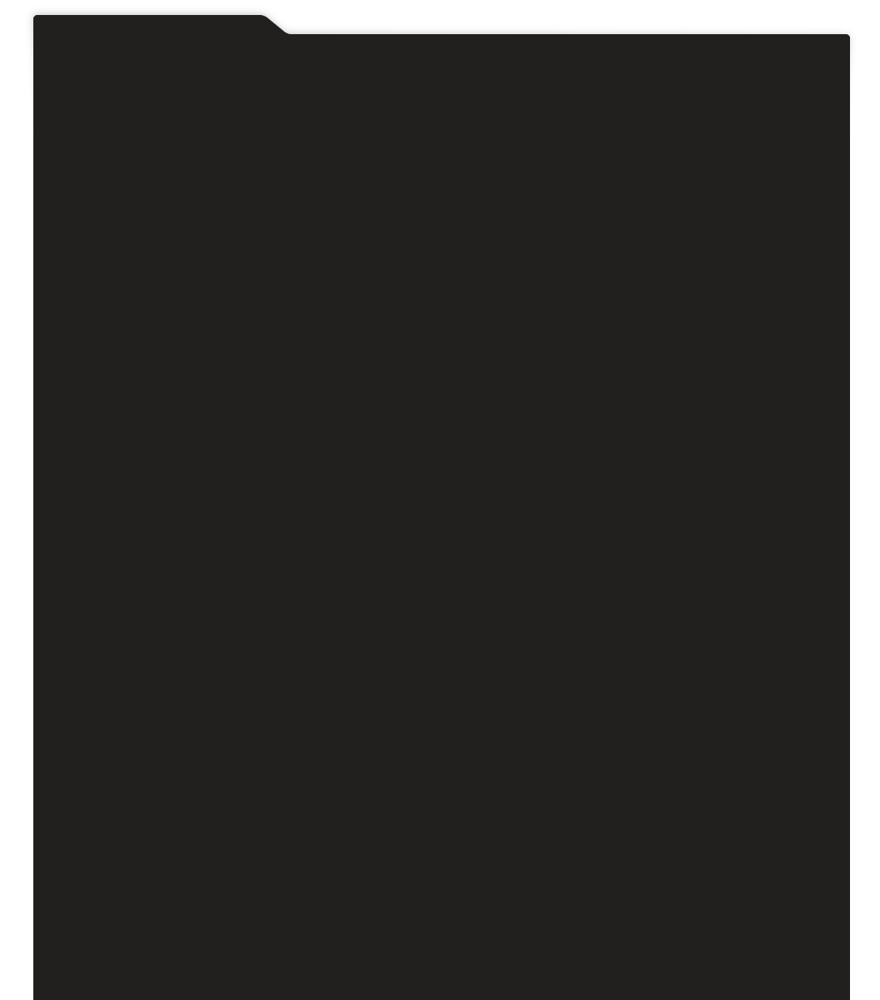
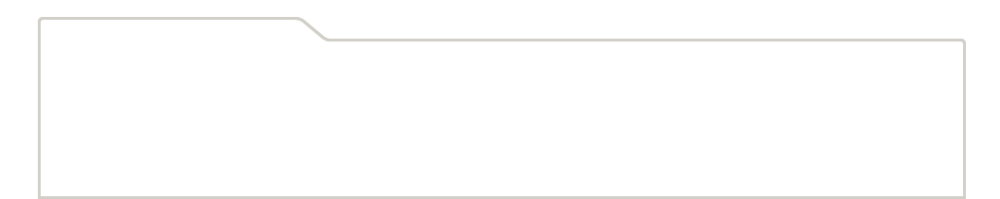
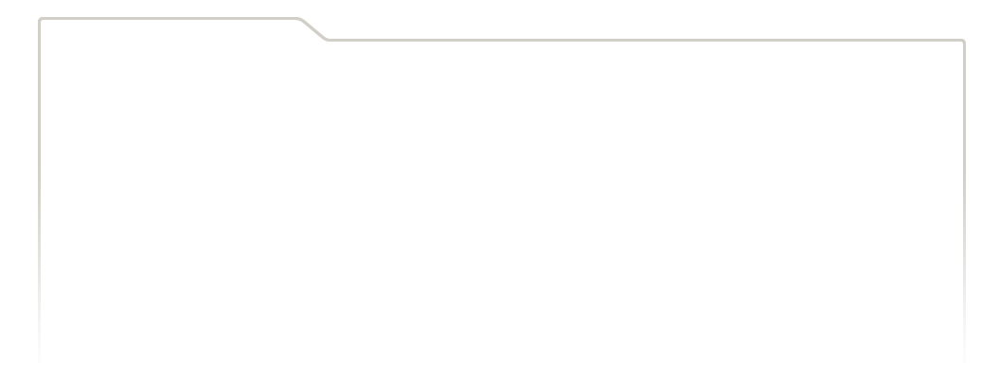
...
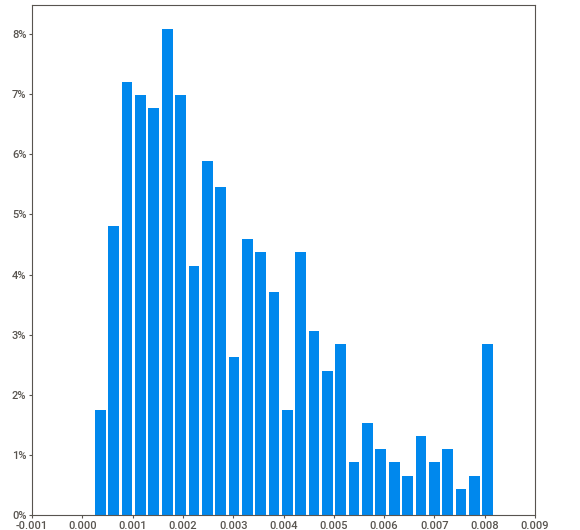
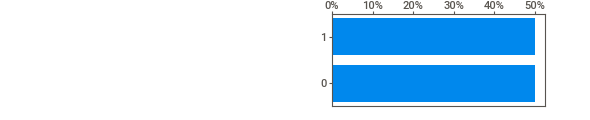
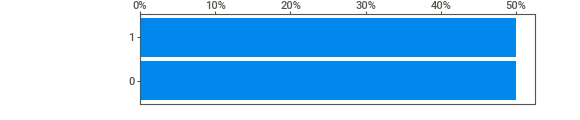
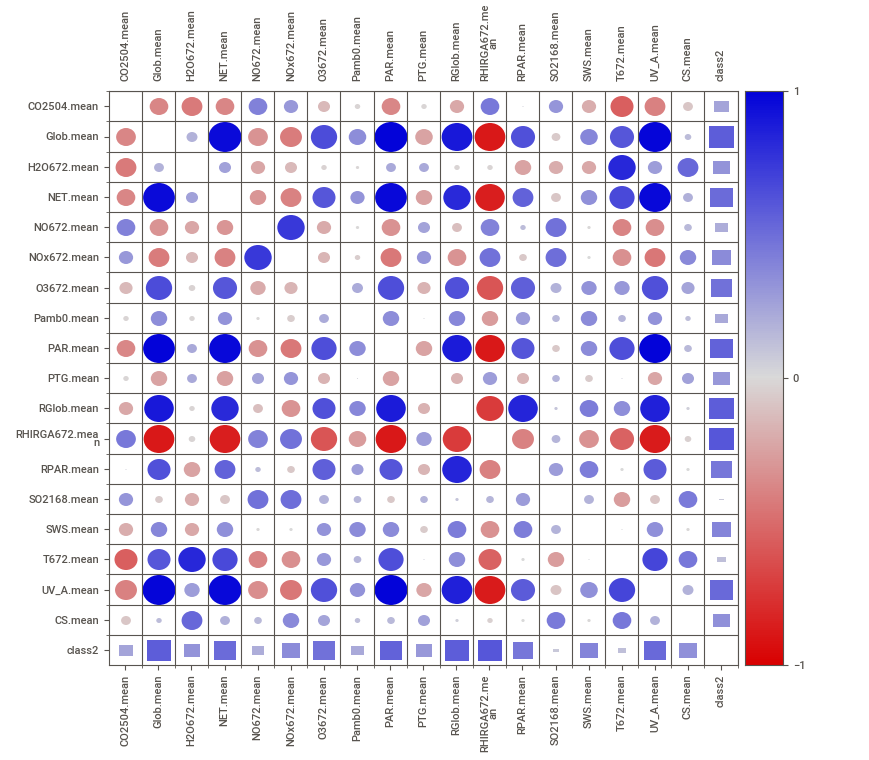
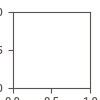

In [14]:
# Generate report
my_report = sweetviz.analyze(singe_measure_df)
my_report.show_html('Small features report.html')
my_report.show_notebook('Small features report.html')

# Pandas Profiling

On full data

In [ ]:
##Pandas profiling (pls note this takes over 8 mins for all the features)
#df.profile_report()
profile=df.profile_report(title='Pandas profiling report')
profile.to_file(output_file='Profiling_Output.html')

On data with manual feature selection

In [ ]:
##Pandas profiling (pls note this takes over 8 mins for all the features)
singe_measure_df.profile_report()
profile = singe_measure_df.profile_report(title='Pandas profiling report for selected features')
profile.to_file(output_file='Feature_Select_Profiling_Output.html')

# Data Clensing of Outliers
We will use Inter-Quartile Range (IQR) proximity rule as our data is partially skewed

# Outliers Detection
We will use Inter-Quartile Range (IQR) proximity rule as our data is partially skewed, more precisely
We will consider outliers the data points which fall 
below Q1 – 1.5 IQR or 
above Q3 + 1.5 IQR
where Q1 and Q3 are the 25th and 75th precentile and
IQR is the inter quartile range Q3-Q1

We will list the outliers and cap them to the allowed corresponding minimum/maximum

In [20]:
def outliers(df, cl_col):

    for columnName, columnData in df.iteritems():
        if columnName == ('class2' or 'class4'):
            continue
        #print(columnName)

    # Calculate percentiles
        percentile25 = columnData.quantile(0.25)
        percentile75 = columnData.quantile(0.75)
    # Calculate IQR
        iqr = percentile75 - percentile25
    # Upper and lower boundaries
        upper_limit = percentile75 + 1.5 * iqr
        lower_limit = percentile25 - 1.5 * iqr
        #print("Allowed Range",lower_limit, "-", upper_limit)
        
    # Find outliers
        for value in columnData:
            if value > upper_limit:
                print(columnName, ":", value, "over limit", " Range (", lower_limit, "-", upper_limit, ")")
                cl_col.add(columnName)
            if  value < lower_limit:
                print(columnName, ":", value, "below limit", lower_limit)
                cl_col.add(columnName)
    # Cap
        df[columnName] = np.where(
            df[columnName] > upper_limit,
            upper_limit,
            df[columnName])
        df[columnName] = np.where(
            df[columnName] < lower_limit,
            lower_limit,
            df[columnName]
        )

cleaned_columns = set()
cleaned_columns_feature_select = set()
    
outliers(df, cleaned_columns)
outliers(singe_measure_df, cleaned_columns_feature_select)


CO2168.std : 11.894822722359299 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 15.590851040306699 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 10.961206951870198 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 17.1608762026332 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 19.4605207623159 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 16.4370589149916 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 16.1352959633819 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 10.837005867732199 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 18.1997861331973 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 13.391440202576304 over limit  Range ( -4.721295901470462 - 10.763553441162177 )
CO2168.std : 11.3418660377021 over limit  Range ( -4.721295901470462 -

# After Clensing
Compare initial versus the dataframe with outliers cleansed for the changed features

In [22]:

if len(cleaned_columns) == 0:
    print("Nothing cleansed")
else:
    print("Columns cleansed", len(cleaned_columns))

    ##sweetwiz comparison for the cleansed features
    my_report_before = sweetviz.compare(df_copy[cleaned_columns], df[cleaned_columns])
    my_report_before.show_html('Initial vs Cleansed for Outliers.html')


Feature: O3504.std                           |▏         | [  2%]   00:00 -> (00:03 left)

Columns cleansed 58


Done! Use 'show' commands to display/save.   |██████████| [100%]   00:11 -> (00:00 left)


Report Initial vs Cleansed for Outliers.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [23]:

if len(cleaned_columns_feature_select) == 0:
    print("Nothing cleansed")
else:
    print("Columns cleansed", len(cleaned_columns_feature_select))

    ##sweetwiz comparison for the cleansed features
    my_report_before = sweetviz.compare(singe_measure_df_copy[cleaned_columns_feature_select], singe_measure_df[cleaned_columns_feature_select])
    my_report_before.show_html('Initial vs Cleansed for Outliers Vol 2.html')

Feature: PTG.mean                            |█         | [ 10%]   00:00 -> (00:00 left)

Columns cleansed 9


Done! Use 'show' commands to display/save.   |██████████| [100%]   00:01 -> (00:00 left)


Report Initial vs Cleansed for Outliers Vol 2.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


Then saving the cleansed data

In [33]:
compression_opts = dict(method='zip',
                        archive_name='training_cleansed.csv')  
df.to_csv('training_cleansed.zip', index=False, compression=compression_opts)

In [24]:
compression_opts = dict(method='zip',
                        archive_name='small_training_cleansed.csv')  
singe_measure_df.to_csv('small_training_cleansed.zip', index=False, compression=compression_opts)